<a href="https://colab.research.google.com/github/Saravanan7272/Digital_Image_Processing/blob/main/IPA_ASS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

###**Assignment 1: Tasks 1 to 4 (Image Acquisition to Noise Filtering and Denoising)**

Image Shape (H x W x C): 1280 x 960 x 3
Data Type: uint8
Min Pixel Value: 0
Max Pixel Value: 255
Mean Pixel Value (all channels): 94.07326144748264
Channel Means -> R: 89.12830485026042  G: 90.09956136067709  B: 102.99191813151042
Channel StdDev -> R: 54.635607227253004  G: 49.587276168543575  B: 67.7818902614206


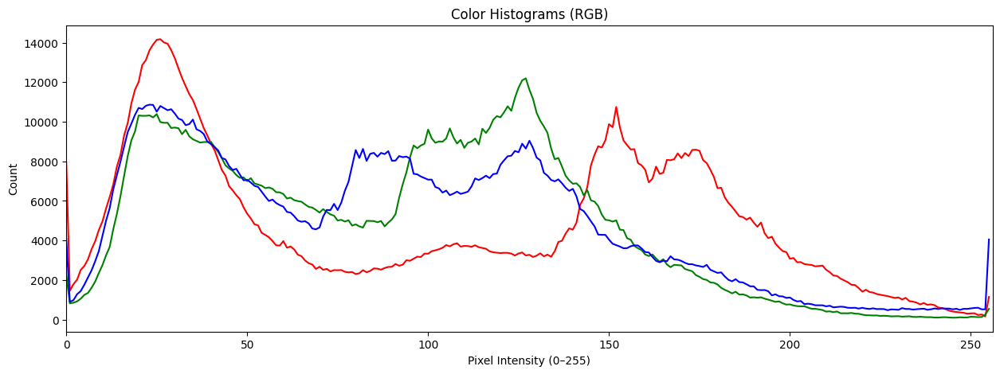

/tmp/ipython-input-2445032019.py:38: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(gray.ravel(),256,[0,256], color='black')


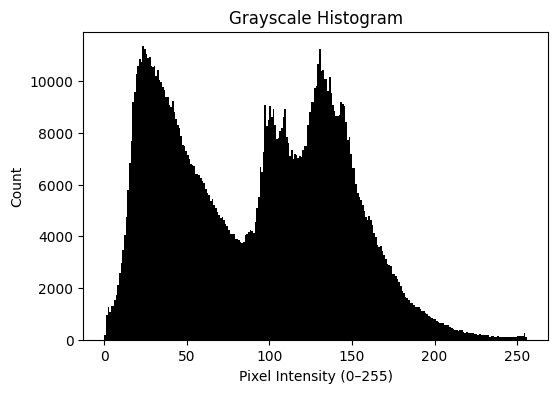

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread('/content/image.jpeg')

if img is None:
    print("Error: Could not load image. Please check the file path.")
else:
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    h, w, ch = img.shape
    print("Image Shape (H x W x C):", h, "x", w, "x", ch)
    print("Data Type:", img.dtype)
    print("Min Pixel Value:", img.min())
    print("Max Pixel Value:", img.max())
    print("Mean Pixel Value (all channels):", img.mean())

    b, g, r = cv2.split(img)

    print("Channel Means -> R:", np.mean(r), " G:", np.mean(g), " B:", np.mean(b))
    print("Channel StdDev -> R:", np.std(r), " G:", np.std(g), " B:", np.std(b))

    plt.figure(figsize=(15,5))

    colors = ('r','g','b')
    for i,col in enumerate(colors):
        hist = cv2.calcHist([img],[i],None,[256],[0,256])
        plt.plot(hist, color=col)
        plt.xlim([0,256])
    plt.title("Color Histograms (RGB)")
    plt.xlabel("Pixel Intensity (0–255)")
    plt.ylabel("Count")
    plt.show()

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    plt.figure(figsize=(6,4))
    plt.hist(gray.ravel(),256,[0,256], color='black')
    plt.title("Grayscale Histogram")
    plt.xlabel("Pixel Intensity (0–255)")
    plt.ylabel("Count")
    plt.show()

In [ ]:

import cv2, numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim
from math import log10

img_bgr = cv2.imread('/content/image.jpeg')
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
h, w, _ = img_rgb.shape

orig = img_rgb.copy().astype(np.float32)



In [ ]:
def compute_mse(a, b):
    return np.mean((a.astype(np.float32) - b.astype(np.float32))**2)

def compute_psnr(a, b):
    mse = compute_mse(a,b)
    if mse == 0: return float('inf')
    PIXEL_MAX = 255.0
    return 10 * log10((PIXEL_MAX**2)/mse)

def compute_ssim_gray(a, b):
    a_gray = cv2.cvtColor(a.astype(np.uint8), cv2.COLOR_RGB2GRAY)
    b_gray = cv2.cvtColor(b.astype(np.uint8), cv2.COLOR_RGB2GRAY)
    s = ssim(a_gray, b_gray, data_range=255)
    return s

In [ ]:
roi_coords = {
    'sky': (50, 20, 600, 260),
    'monument': (450, 220, 830, 640),
    'grass': (700, 620, 1180, 900)
}

def show_grid(imgs, titles, cmap=None, figsize=(12,6)):
    n = len(imgs)
    plt.figure(figsize=figsize)
    for i in range(n):
        plt.subplot(1,n,i+1)
        plt.imshow(imgs[i], cmap=cmap)
        plt.title(titles[i])
        plt.axis('off')
    plt.show()

def add_gaussian_noise(img, sigma):
    noise = np.random.normal(0, sigma, img.shape).astype(np.float32)
    noisy = img + noise
    noisy = np.clip(noisy, 0, 255)
    return noisy

def add_salt_pepper(img, prob):
    noisy = img.copy().astype(np.uint8)
    rnd = np.random.rand(h, w)
    salt = rnd < (prob/2)
    pepper = (rnd >= (prob/2)) & (rnd < prob)
    noisy[salt] = 255
    noisy[pepper] = 0
    return noisy.astype(np.float32)

def add_speckle(img, sigma):
    noise = np.random.normal(0, sigma, img.shape).astype(np.float32)
    noisy = img + img * noise
    noisy = np.clip(noisy, 0, 255)
    return noisy





In [ ]:
gauss_sigmas = [5, 15, 30]
sp_probs = [0.01, 0.03, 0.05]
speckle_sigmas = [0.02, 0.05, 0.1]
results = []

for s in gauss_sigmas:
    noisy = add_gaussian_noise(orig, s)
    mse = compute_mse(orig, noisy)
    p = compute_psnr(orig, noisy)
    ss = compute_ssim_gray(orig, noisy)
    results.append(('Gaussian', s, noisy.astype(np.uint8), mse, p, ss))

for pval in sp_probs:
    noisy = add_salt_pepper(orig, pval)
    mse = compute_mse(orig, noisy)
    p = compute_psnr(orig, noisy)
    ss = compute_ssim_gray(orig, noisy)
    results.append(('SaltPepper', pval, noisy.astype(np.uint8), mse, p, ss))

for s in speckle_sigmas:
    noisy = add_speckle(orig, s)
    mse = compute_mse(orig, noisy)
    p = compute_psnr(orig, noisy)
    ss = compute_ssim_gray(orig, noisy)
    results.append(('Speckle', s, noisy.astype(np.uint8), mse, p, ss))


         Type  Param          MSE  PSNR(dB)    SSIM
0    Gaussian   5.00    24.799999     34.19  0.9363
1    Gaussian  15.00   216.970001     24.77  0.6864
2    Gaussian  30.00   811.489990     19.04  0.4399
3  SaltPepper   0.01   211.110001     24.89  0.7868
4  SaltPepper   0.03   623.200012     20.18  0.5248
5  SaltPepper   0.05  1038.609985     17.97  0.3757
6     Speckle   0.02     4.860000     41.26  0.9843
7     Speckle   0.05    30.240000     33.32  0.9221
8     Speckle   0.10   119.379997     27.36  0.7976


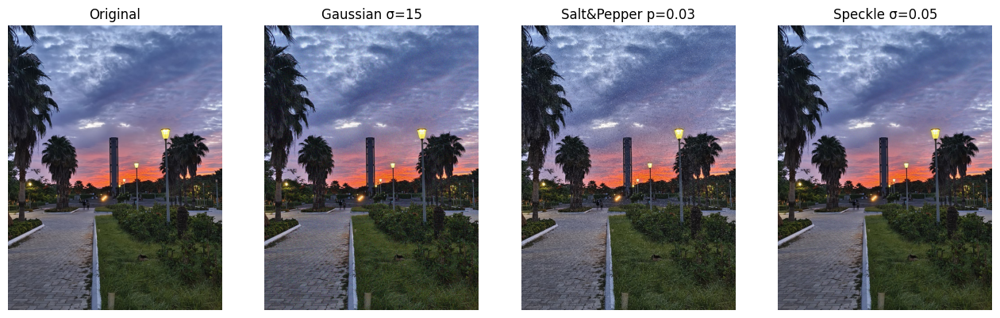

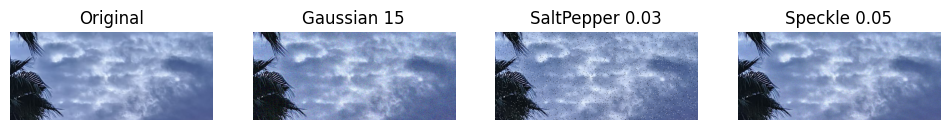

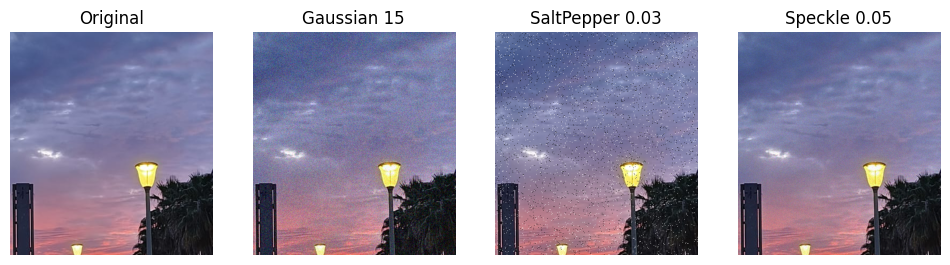

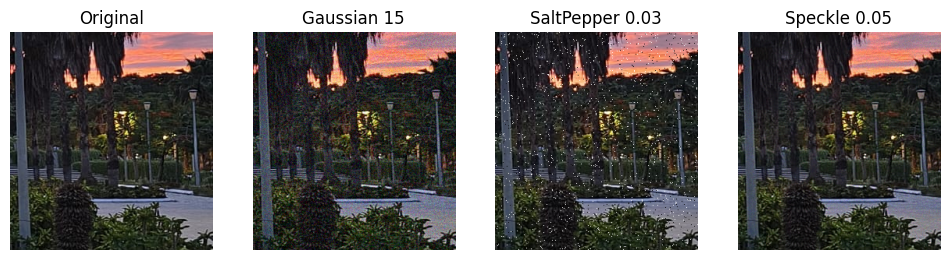

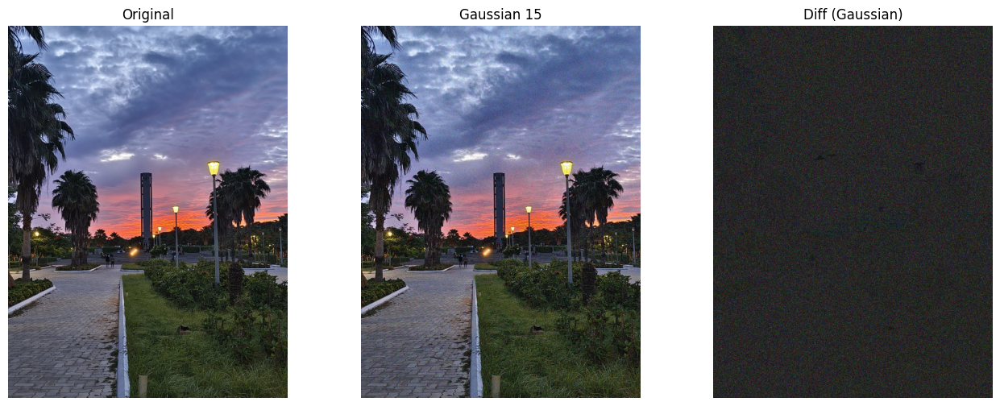

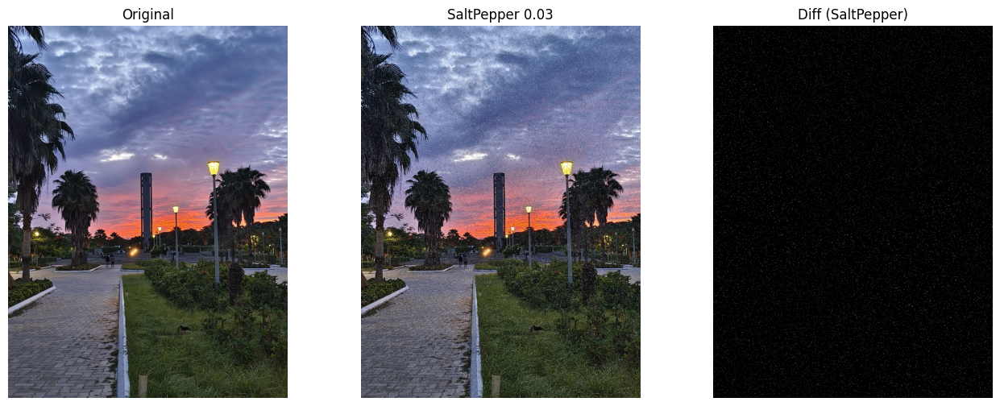

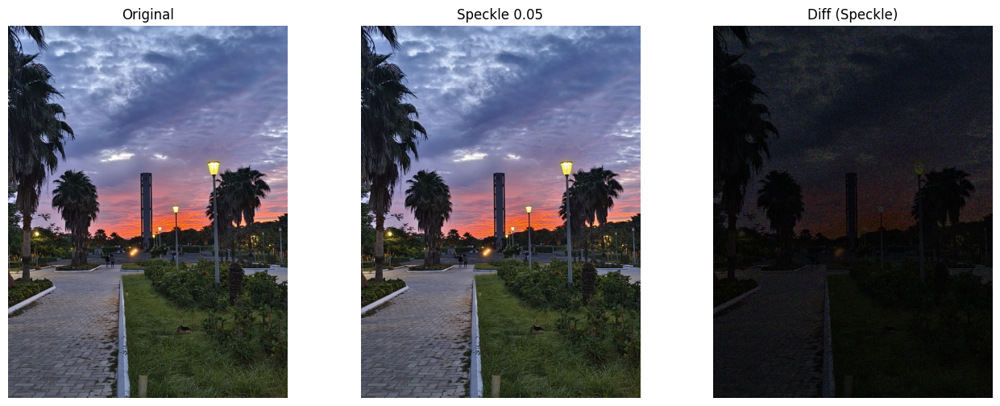

Saved noisy examples to noisy_outputs


In [ ]:
import pandas as pd
rows = []
for (typ,param,noisy,mse,p,ss) in results:
    rows.append({'Type':typ, 'Param':param, 'MSE':round(mse,2), 'PSNR(dB)':round(p,2), 'SSIM':round(ss,4)})
df = pd.DataFrame(rows)
print(df)

exs = []
titles = []
exs.append(orig.astype(np.uint8)); titles.append('Original')
g = next(no for (t,param,no,mse,p,ss) in results if t=='Gaussian' and param==15)
exs.append(g); titles.append('Gaussian σ=15')
sp = next(no for (t,param,no,mse,p,ss) in results if t=='SaltPepper' and param==0.03)
exs.append(sp); titles.append('Salt&Pepper p=0.03')
spk = next(no for (t,param,no,mse,p,ss) in results if t=='Speckle' and param==0.05)
exs.append(spk); titles.append('Speckle σ=0.05')

show_grid(exs, titles, figsize=(16,8))

def crop(img, rect):
    x1,y1,x2,y2 = rect
    x1 = max(0, x1)
    y1 = max(0, y1)
    x2 = min(img.shape[1], x2)
    y2 = min(img.shape[0], y2)

    if x2 <= x1 or y2 <= y1:
        return None

    return img[y1:y2, x1:x2]

display_rois = [('Gaussian',15), ('SaltPepper',0.03), ('Speckle',0.05)]
for roi_name, rect in roi_coords.items():
    imgs = []
    titles = []
    orig_crop = crop(orig.astype(np.uint8), rect)
    if orig_crop is not None:
        imgs.append(orig_crop)
        titles.append('Original')
    for typ,param in display_rois:
        noisy = next(no for (t,p,no,mse,ps,ss) in results if t==typ and p==param)
        noisy_crop = crop(noisy, rect)
        if noisy_crop is not None:
            imgs.append(noisy_crop)
            titles.append(f'{typ} {param}')
    if imgs:
        show_grid(imgs, titles, figsize=(12,4))

for typ,param in display_rois:
    noisy = next(no for (t,p,no,mse,ps,ss) in results if t==typ and p==param)
    diff = np.abs(orig - noisy)
    diff_disp = (diff / diff.max() * 255).astype(np.uint8)
    show_grid([orig.astype(np.uint8), noisy, diff_disp],
              ['Original', f'{typ} {param}', f'Diff ({typ})'],
              figsize=(16,6))


import os
import cv2

outdir = "noisy_outputs"
os.makedirs(outdir, exist_ok=True)

for typ, param, noisy, mse, p, ss in results:
    filename = f"{typ}_{str(param).replace('.','p')}.png"
    filepath = os.path.join(outdir, filename)

    cv2.imwrite(filepath, cv2.cvtColor(noisy.astype(np.uint8), cv2.COLOR_RGB2BGR))

print("Saved noisy examples to", outdir)

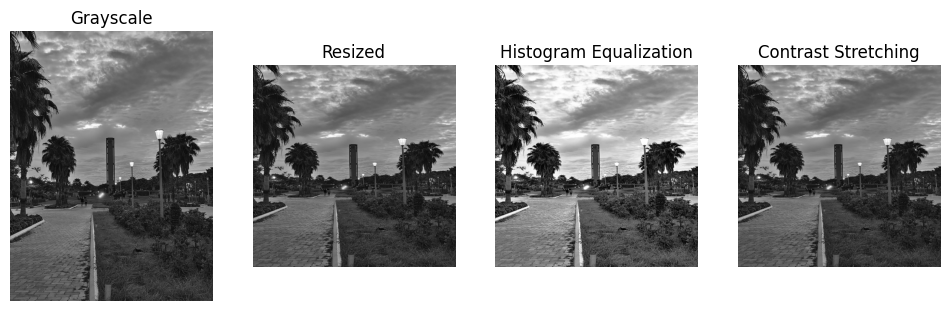

In [ ]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread("image.jpeg")

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

resized = cv2.resize(gray, (512, 512))

histeq = cv2.equalizeHist(resized)

r_min, r_max = resized.min(), resized.max()
contrast = ((resized - r_min) / (r_max - r_min) * 255).astype('uint8')

titles = ["Grayscale", "Resized", "Histogram Equalization", "Contrast Stretching"]
images = [gray, resized, histeq, contrast]

plt.figure(figsize=(12,6))
for i in range(4):
    plt.subplot(1,4,i+1)
    plt.imshow(images[i], cmap='gray')
    plt.title(titles[i])
    plt.axis("off")
plt.show()


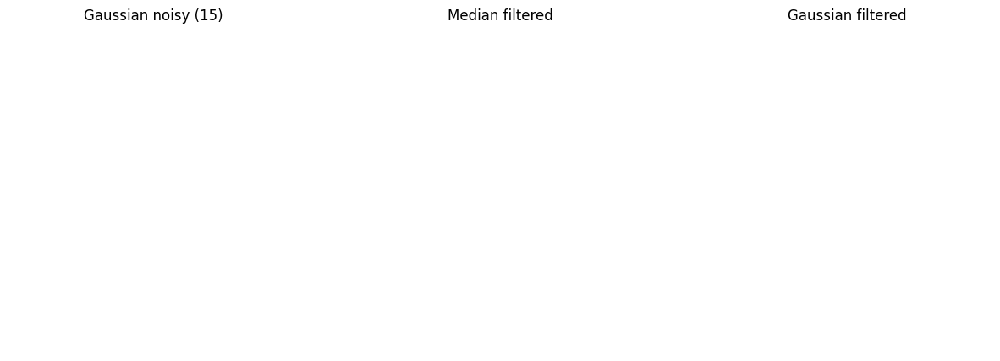

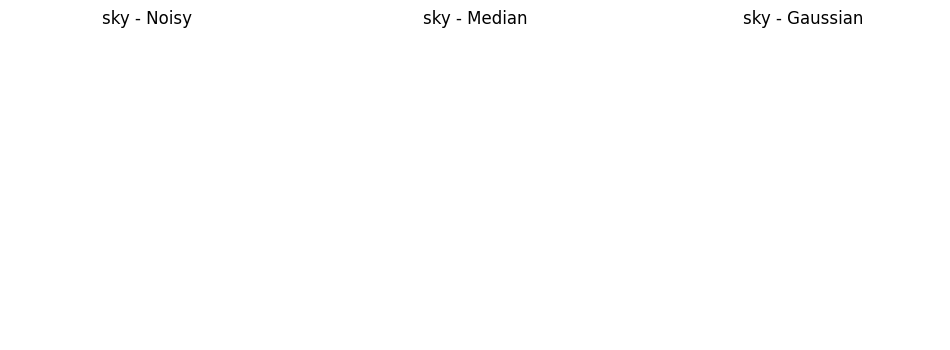

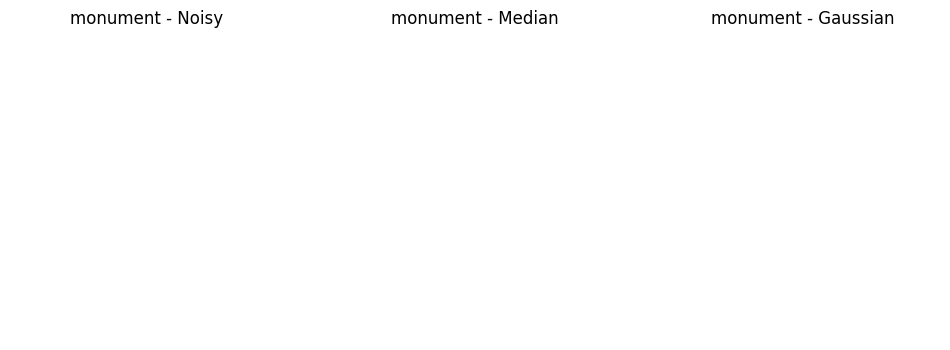

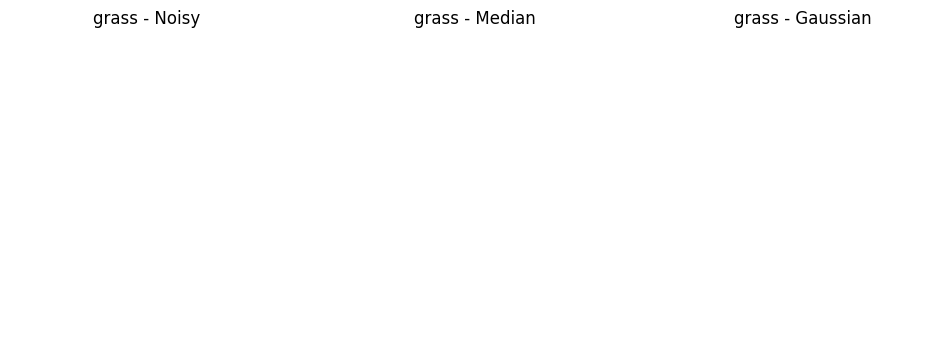

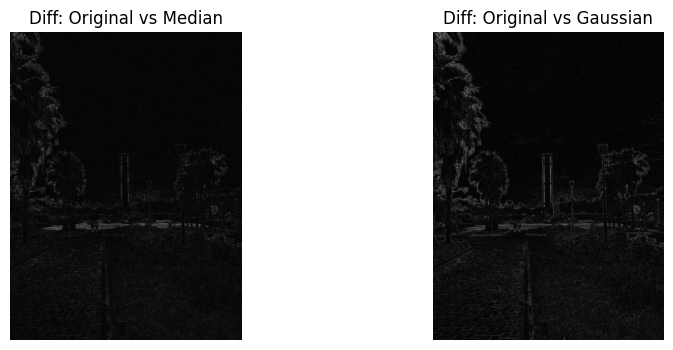

...

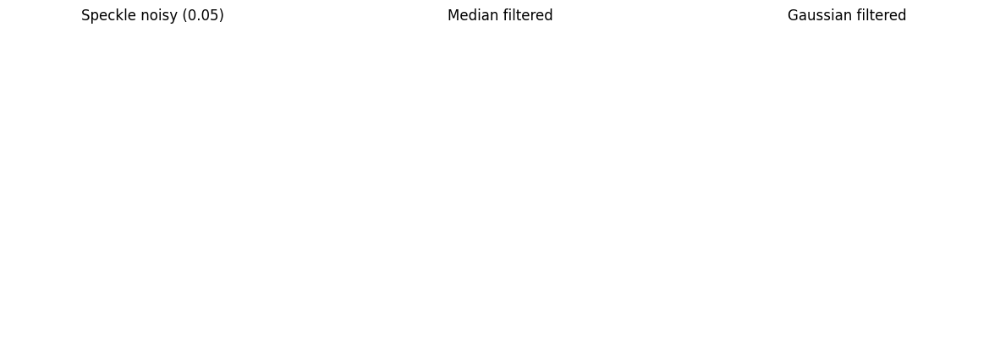

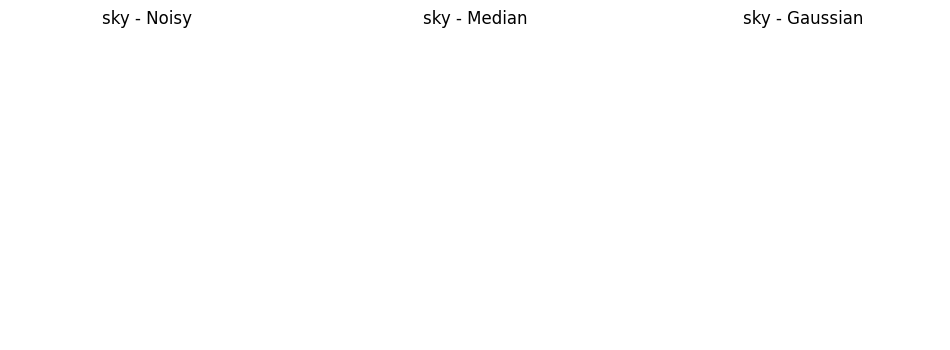

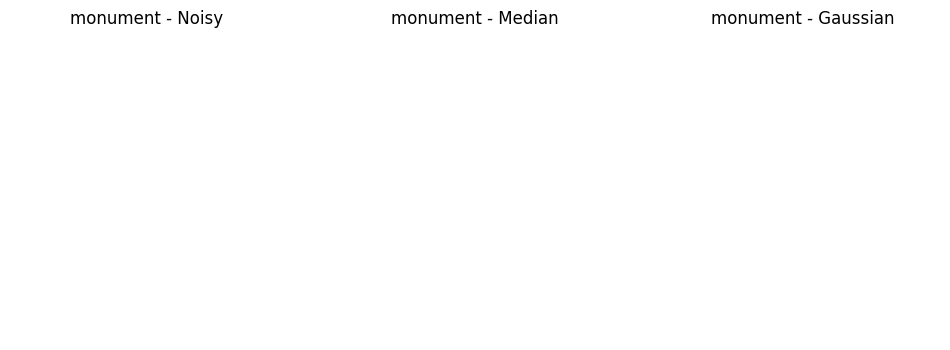

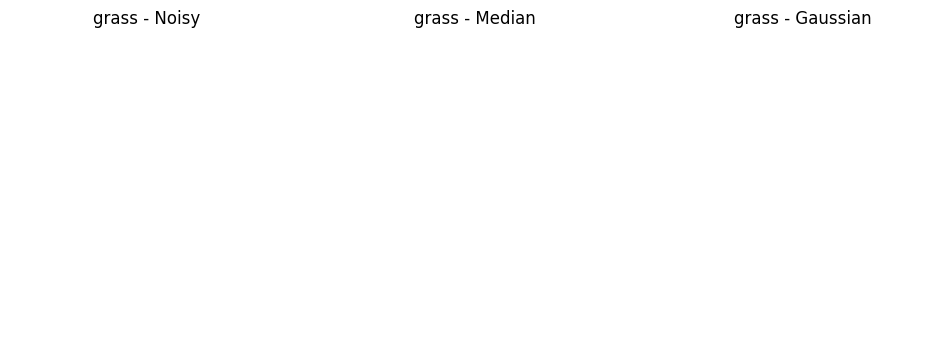

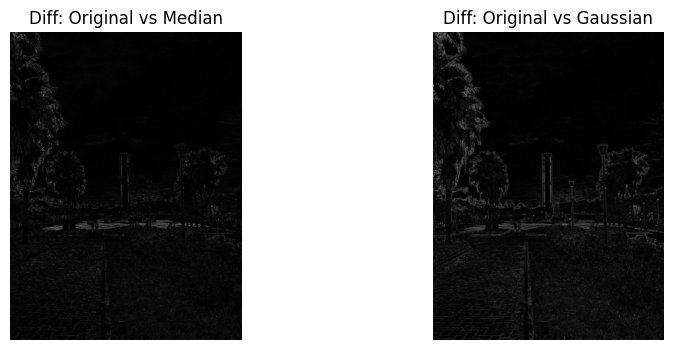

,Type,Param,Noisy_PSNR,Median_PSNR,Gaussian_PSNR,Noisy_SSIM,Median_SSIM,Gaussian_SSIM
0,Gaussian,15.00,28.223,27.136,27.345,0.6864,0.7669,0.8023
1,SaltPepper,0.03,20.295,27.690,25.900,0.5248,0.8579,0.6841
2,Speckle,0.05,37.198,27.719,27.670,0.9221,0.8442,0.8400


Saved filtered outputs to: filter_outputs


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim

IMAGE_PATH = "/content/image.jpeg"
NOISY_DIR  = "noisy_outputs"
OUT_DIR    = "filter_outputs"
os.makedirs(OUT_DIR, exist_ok=True)

def read_bgr(path):
    im = cv2.imread(path)
    if im is None:
        raise FileNotFoundError(f"Could not read image: {path}")
    return im

def bgr2rgb_for_plot(im_bgr):
    """Convert BGR image to RGB for display with matplotlib"""
    return cv2.cvtColor(im_bgr, cv2.COLOR_BGR2RGB)

def show_grid(imgs_bgr_or_gray, titles, figsize=(14,5)):
    """Accepts list of images either BGR (3-channel) or grayscale (2-channel).
       Displays each in a row using matplotlib. Converts BGR -> RGB only for plotting."""
    plt.figure(figsize=figsize)
    n = len(imgs_bgr_or_gray)
    for i,im in enumerate(imgs_bgr_or_gray):
        plt.subplot(1, n, i+1)
        if im is None or im.size == 0:
            plt.text(0.5,0.5, "None", ha='center', va='center')
        elif im.ndim == 2:
            plt.imshow(im, cmap='gray', vmin=0, vmax=255)
            plt.imshow(bgr2rgb_for_plot(im))
        plt.title(titles[i])
        plt.axis('off')
    plt.show()

def crop(img, rect):
    x1,y1,x2,y2 = rect
    x1 = max(0, x1)
    y1 = max(0, y1)
    x2 = min(img.shape[1], x2)
    y2 = min(img.shape[0], y2)

    if x2 <= x1 or y2 <= y1:
        return None

    return img[y1:y2, x1:x2]

roi_coords = {
    'sky': (50, 20, 600, 260),
    'monument': (450, 220, 830, 640),
    'grass': (700, 620, 1180, 900)
}

orig_bgr = read_bgr(IMAGE_PATH)

orig_gray = cv2.cvtColor(orig_bgr, cv2.COLOR_BGR2GRAY)

def load_noisy_bgr(type_name, param):
    filename = f"{type_name}_{str(param).replace('.','p')}.png"
    path = os.path.join(NOISY_DIR, filename)
    if not os.path.exists(path):
        raise FileNotFoundError(path)
    return read_bgr(path)

examples_to_use = [
    ('Gaussian', 15),
    ('SaltPepper', 0.03),
    ('Speckle', 0.05)
]

noisy_examples = {}
for t,p in examples_to_use:
    noisy_examples[(t,p)] = load_noisy_bgr(t, p)

def apply_median(bgr_img, ksize=3):
    return cv2.medianBlur(bgr_img, ksize)

def apply_gaussian(bgr_img, ksize=(5,5), sigma=1):
    return cv2.GaussianBlur(bgr_img, ksize, sigma)

rows = []
for (typ,param), noisy_bgr in noisy_examples.items():
    median_bgr = apply_median(noisy_bgr, ksize=3)
    gauss_bgr  = apply_gaussian(noisy_bgr, ksize=(5,5), sigma=1)

    noisy_gray  = cv2.cvtColor(noisy_bgr, cv2.COLOR_BGR2GRAY)
    median_gray = cv2.cvtColor(median_bgr, cv2.COLOR_BGR2GRAY)
    gauss_gray  = cv2.cvtColor(gauss_bgr, cv2.COLOR_BGR2GRAY)

    rows.append({
        'Type': typ,
        'Param': param,
        'Noisy_PSNR': round(psnr(orig_gray, noisy_gray), 3),
        'Median_PSNR': round(psnr(orig_gray, median_gray), 3),
        'Gaussian_PSNR': round(psnr(orig_gray, gauss_gray), 3),
        'Noisy_SSIM': round(ssim(orig_gray, noisy_gray, data_range=255), 4),
        'Median_SSIM': round(ssim(orig_gray, median_gray, data_range=255), 4),
        'Gaussian_SSIM': round(ssim(orig_gray, gauss_gray, data_range=255), 4),
    })

    show_grid([noisy_bgr, median_bgr, gauss_bgr],
              [f"{typ} noisy ({param})", "Median filtered", "Gaussian filtered"],
              figsize=(15,5))

    for roi_name, rect in roi_coords.items():
        noisy_crop  = crop(noisy_bgr, rect)
        median_crop = crop(median_bgr, rect)
        gauss_crop  = crop(gauss_bgr, rect)
        imgs = [noisy_crop, median_crop, gauss_crop]
        titles = [f"{roi_name} - Noisy", f"{roi_name} - Median", f"{roi_name} - Gaussian"]
        if any(img is not None and img.size > 0 for img in imgs):
             show_grid(imgs, titles, figsize=(12,4))


    median_diff = cv2.absdiff(orig_bgr, median_bgr)
    gauss_diff  = cv2.absdiff(orig_bgr, gauss_bgr)
    def diff_to_display(diff_bgr):
        diff_gray = cv2.cvtColor(diff_bgr, cv2.COLOR_BGR2GRAY)
        if diff_gray.max() == 0:
            return diff_gray
        scaled = (diff_gray.astype(np.float32) / diff_gray.max() * 255).astype(np.uint8)
        return scaled

    show_grid([diff_to_display(median_diff), diff_to_display(gauss_diff)],
              ["Diff: Original vs Median", "Diff: Original vs Gaussian"],
              figsize=(10,4))

    med_name = f"{typ}_{str(param).replace('.','p')}_median.png"
    g_name   = f"{typ}_{str(param).replace('.','p')}_gauss.png"
    cv2.imwrite(os.path.join(OUT_DIR, med_name), median_bgr)
    cv2.imwrite(os.path.join(OUT_DIR, g_name), gauss_bgr)


df = pd.DataFrame(rows)
display(df)
print("Saved filtered outputs to:", OUT_DIR)

###**Assignment 2: Tasks 5 to 7 (Segmentation to Reflection and Visualization)**

Loaded image: image.jpeg
Image shape: (1280, 960, 3)
Converted to grayscale for segmentation.
Applied Gaussian Blur to smooth image.
Otsu's threshold chosen automatically: 88.00
Morphological operations done (open & close).

Performing K-Means color segmentation (k=4)...
Sky/Object cluster index: 1, mean blue: 187.55
Canny Edge Detection applied.

Segmentation Comparison:
IoU (Otsu vs KMeans) = 0.488
Dice Coefficient = 0.656
Area (Otsu): 673613 | Area (KMeans): 333064


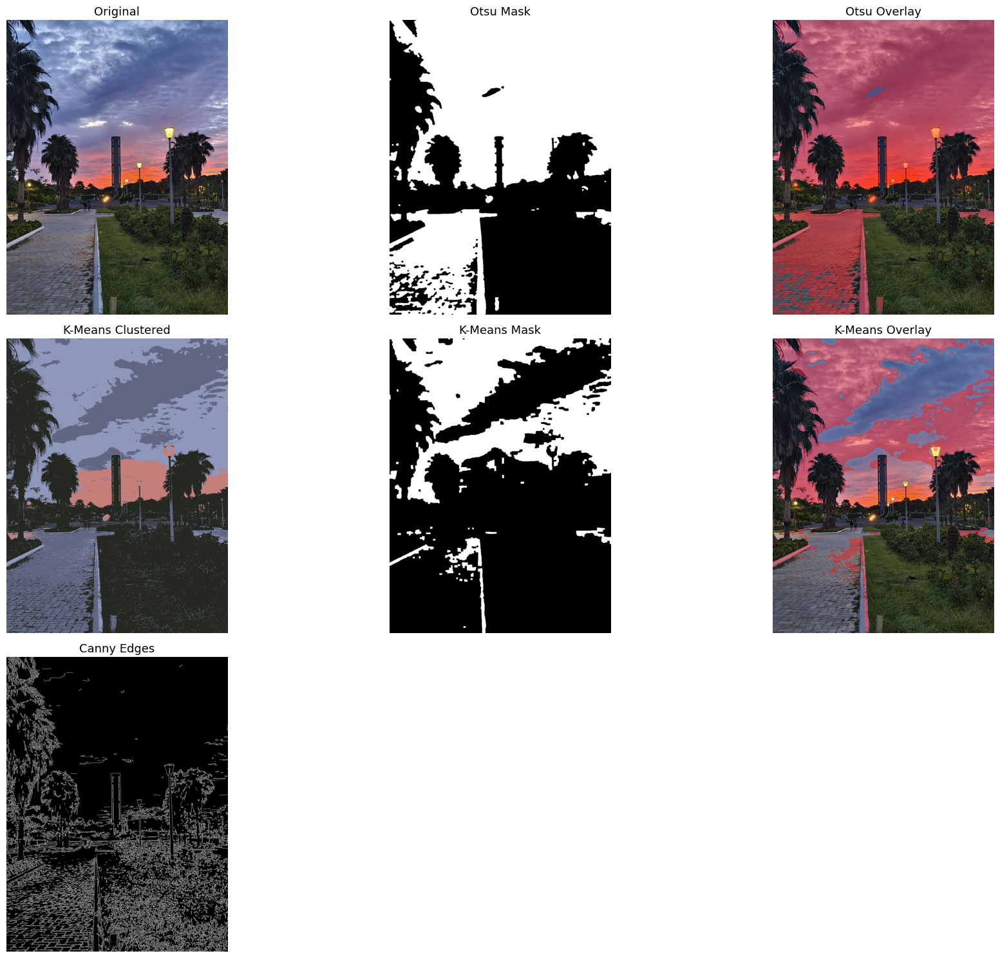


All outputs saved inside 'segmentation_outputs/' folder and displayed clearly in multi-row layout.


In [ ]:

import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

def show_grid(images, titles, cmap_flags=None, cols=3):
    """Display multiple images in grid format (3 per row)."""
    n = len(images)
    rows = (n + cols - 1) // cols
    plt.figure(figsize=(6*cols, 5*rows))
    for i in range(n):
        plt.subplot(rows, cols, i+1)
        if cmap_flags and cmap_flags[i]:
            plt.imshow(images[i], cmap='gray')
        else:
            plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
        plt.title(titles[i], fontsize=13)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

def overlay_mask(img, mask, color=(0,0,255), alpha=0.4):
    overlay = img.copy().astype(np.float32)
    color_arr = np.array(color, dtype=np.float32)
    overlay[mask > 0] = (1 - alpha) * overlay[mask > 0] + alpha * color_arr
    return overlay.astype(np.uint8)

def iou_dice(mask1, mask2):
    mask1 = (mask1 > 0)
    mask2 = (mask2 > 0)
    intersection = np.logical_and(mask1, mask2).sum()
    union = np.logical_or(mask1, mask2).sum()
    iou = intersection / union
    dice = 2 * intersection / (mask1.sum() + mask2.sum())
    return iou, dice

IMAGE_PATH = "image.jpeg"
img = cv2.imread(IMAGE_PATH)
if img is None:
    raise FileNotFoundError("Image not found!")
print("Loaded image:", IMAGE_PATH)
print("Image shape:", img.shape)

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
print("Converted to grayscale for segmentation.")

blur = cv2.GaussianBlur(gray, (5, 5), 0)
print("Applied Gaussian Blur to smooth image.")

otsu_val, otsu_mask = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
print(f"Otsu's threshold chosen automatically: {otsu_val:.2f}")

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7,7))
otsu_clean = cv2.morphologyEx(otsu_mask, cv2.MORPH_CLOSE, kernel)
otsu_clean = cv2.morphologyEx(otsu_clean, cv2.MORPH_OPEN, kernel)
print("Morphological operations done (open & close).")

overlay_otsu = overlay_mask(img, otsu_clean)

print("\nPerforming K-Means color segmentation (k=4)...")
Z = img.reshape((-1, 3))
Z = np.float32(Z)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
K = 4
ret, label, center = cv2.kmeans(Z, K, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
center = np.uint8(center)
res = center[label.flatten()]
res2 = res.reshape(img.shape)

label_img = label.reshape(img.shape[:2])
means = [img[:, :, 0][label_img == i].mean() if np.any(label_img == i) else 0 for i in range(K)]
sky_cluster = int(np.argmax(means))
print(f"Sky/Object cluster index: {sky_cluster}, mean blue: {means[sky_cluster]:.2f}")

kmeans_mask = np.uint8(label_img == sky_cluster) * 255
kernel2 = np.ones((7, 7), np.uint8)
kmeans_clean = cv2.morphologyEx(kmeans_mask, cv2.MORPH_CLOSE, kernel2)
kmeans_clean = cv2.morphologyEx(kmeans_clean, cv2.MORPH_OPEN, kernel2)
overlay_kmeans = overlay_mask(img, kmeans_clean)

edges = cv2.Canny(gray, 100, 200)
print("Canny Edge Detection applied.")

iou, dice = iou_dice(otsu_clean, kmeans_clean)
print(f"\nSegmentation Comparison:")
print(f"IoU (Otsu vs KMeans) = {iou:.3f}")
print(f"Dice Coefficient = {dice:.3f}")
print(f"Area (Otsu): {(otsu_clean>0).sum()} | Area (KMeans): {(kmeans_clean>0).sum()}")

show_grid(
    [img, otsu_clean, overlay_otsu, res2, kmeans_clean, overlay_kmeans, edges],
    ["Original", "Otsu Mask", "Otsu Overlay", "K-Means Clustered", "K-Means Mask", "K-Means Overlay", "Canny Edges"],
    [False, True, False, False, True, False, True],
    cols=3
)

os.makedirs("segmentation_outputs", exist_ok=True)
cv2.imwrite("segmentation_outputs/otsu_mask.png", otsu_clean)
cv2.imwrite("segmentation_outputs/kmeans_mask.png", kmeans_clean)
cv2.imwrite("segmentation_outputs/otsu_overlay.png", overlay_otsu)
cv2.imwrite("segmentation_outputs/kmeans_overlay.png", overlay_kmeans)
cv2.imwrite("segmentation_outputs/canny_edges.png", edges)
print("\nAll outputs saved inside 'segmentation_outputs/' folder and displayed clearly in multi-row layout.")


 Loaded original image: image.jpeg (Size: 960x1280)


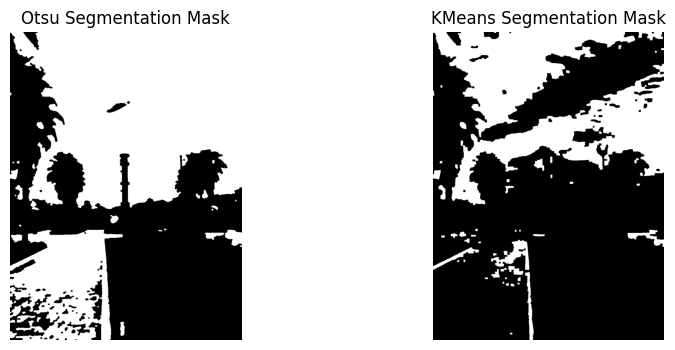

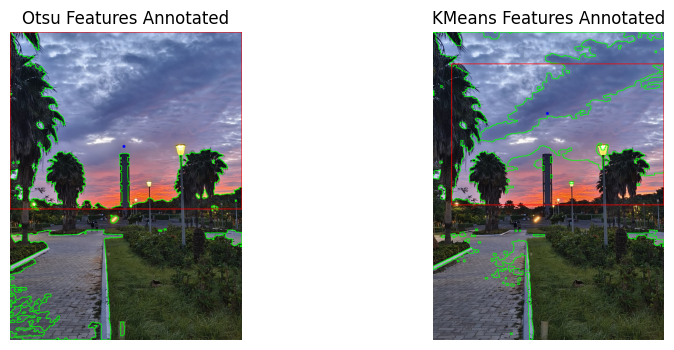


===== FEATURE EXTRACTION RESULTS =====
>> OTSU Segmentation:
   area: 673613
   centroid: (471, 475)
   bbox: (np.int64(0), np.int64(0), np.int64(959), np.int64(735))
   largest_comp_area: 524799
   area_fraction: 0.5481876627604166

>> KMEANS Segmentation:
   area: 333064
   centroid: (475, 338)
   bbox: (np.int64(77), np.int64(132), np.int64(959), np.int64(718))
   largest_comp_area: 155466
   area_fraction: 0.27104817708333334


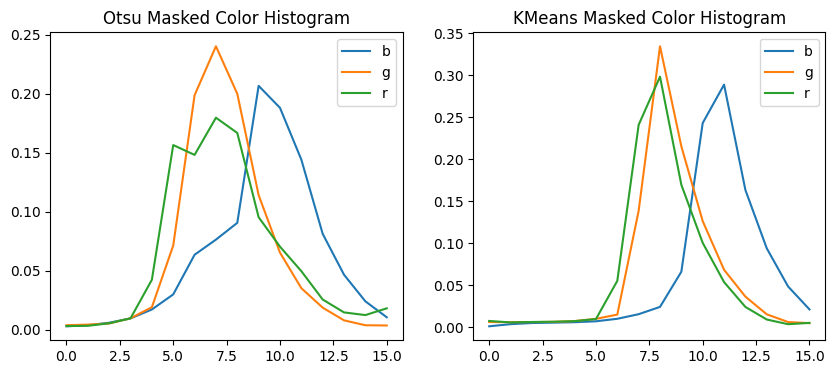


 Saved annotated feature images to: features_outputs


In [ ]:

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

IMAGE_PATH = "image.jpeg"
SEG_DIR = "segmentation_outputs"
OUT_DIR = "features_outputs"
os.makedirs(OUT_DIR, exist_ok=True)

orig = cv2.imread(IMAGE_PATH)
H, W = orig.shape[:2]
print(f" Loaded original image: {IMAGE_PATH} (Size: {W}x{H})")

def load_mask(path):
    mask = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    if mask is None:
        raise FileNotFoundError(f"Mask not found: {path}")
    return (mask > 0).astype(np.uint8)

otsu_mask = load_mask(os.path.join(SEG_DIR, "otsu_mask.png"))
kmeans_mask = load_mask(os.path.join(SEG_DIR, "kmeans_mask.png"))

plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.imshow(otsu_mask, cmap='gray')
plt.title("Otsu Segmentation Mask")
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(kmeans_mask, cmap='gray')
plt.title("KMeans Segmentation Mask")
plt.axis('off')
plt.show()

def region_props(mask):
    """Compute area, centroid, and bounding box of largest connected component."""
    area = int(mask.sum())
    if area == 0:
        return {'area': 0}
    M = cv2.moments((mask * 255).astype(np.uint8))
    cx = int(M['m10'] / M['m00'])
    cy = int(M['m01'] / M['m00'])
    num, labels = cv2.connectedComponents(mask.astype(np.uint8))
    max_area, bbox = 0, None
    for c in range(1, num):
        comp_mask = (labels == c)
        a = comp_mask.sum()
        if a > max_area:
            max_area = a
            ys, xs = np.where(comp_mask)
            bbox = (xs.min(), ys.min(), xs.max(), ys.max())
    return {'area': area, 'centroid': (cx, cy), 'bbox': bbox, 'largest_comp_area': max_area}

def color_hist_for_mask(img_bgr, mask, bins=16):
    """Compute normalized color histogram (B, G, R) within the mask."""
    hist = {}
    for i, ch in enumerate(['b', 'g', 'r']):
        h = cv2.calcHist([img_bgr], [i], mask.astype(np.uint8)*255, [bins], [0, 256]).flatten()
        hist[ch] = h / (h.sum() + 1e-9)
    return hist

otsu_props = region_props(otsu_mask)
kmeans_props = region_props(kmeans_mask)

otsu_props['area_fraction'] = otsu_props['area'] / (H * W)
kmeans_props['area_fraction'] = kmeans_props['area'] / (H * W)

otsu_props['hist'] = color_hist_for_mask(orig, otsu_mask)
kmeans_props['hist'] = color_hist_for_mask(orig, kmeans_mask)

def annotate_and_save(img, mask, props, fname):
    out = img.copy()
    contours, _ = cv2.findContours((mask * 255).astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(out, contours, -1, (0, 255, 0), 2)
    if 'centroid' in props:
        cx, cy = props['centroid']
        cv2.circle(out, (cx, cy), 6, (255, 0, 0), -1)
    if 'bbox' in props and props['bbox'] is not None:
        x1, y1, x2, y2 = props['bbox']
        cv2.rectangle(out, (x1, y1), (x2, y2), (0, 0, 255), 2)
    cv2.imwrite(fname, out)
    return out

annot_otsu = annotate_and_save(orig, otsu_mask, otsu_props, os.path.join(OUT_DIR, "otsu_features.png"))
annot_km = annotate_and_save(orig, kmeans_mask, kmeans_props, os.path.join(OUT_DIR, "kmeans_features.png"))

plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(annot_otsu, cv2.COLOR_BGR2RGB))
plt.title("Otsu Features Annotated")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(annot_km, cv2.COLOR_BGR2RGB))
plt.title("KMeans Features Annotated")
plt.axis('off')
plt.show()


print("\n===== FEATURE EXTRACTION RESULTS =====")
print(">> OTSU Segmentation:")
for k,v in otsu_props.items():
    if k != 'hist':
        print(f"   {k}: {v}")

print("\n>> KMEANS Segmentation:")
for k,v in kmeans_props.items():
    if k != 'hist':
        print(f"   {k}: {v}")


plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
for ch in ['b', 'g', 'r']:
    plt.plot(otsu_props['hist'][ch], label=ch)
plt.title("Otsu Masked Color Histogram")
plt.legend()

plt.subplot(1,2,2)
for ch in ['b', 'g', 'r']:
    plt.plot(kmeans_props['hist'][ch], label=ch)
plt.title("KMeans Masked Color Histogram")
plt.legend()
plt.show()

print(f"\n Saved annotated feature images to: {OUT_DIR}")


 Loading images from previous steps...
 Displaying intermediate results...


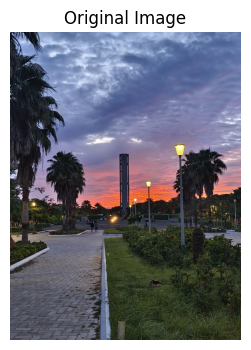

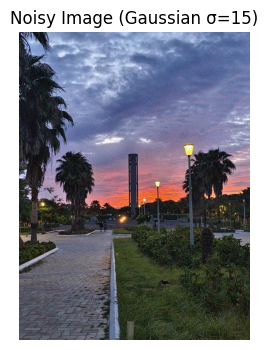

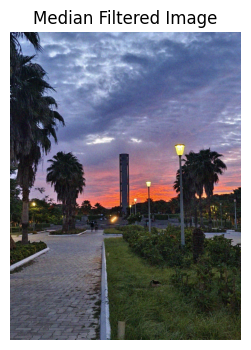

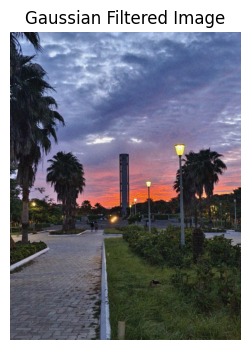

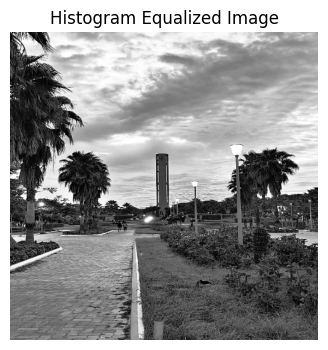

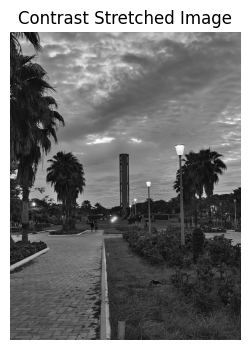

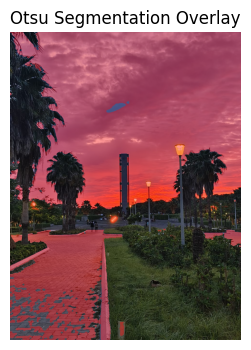

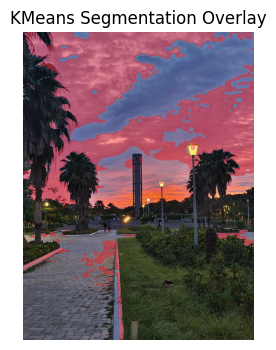

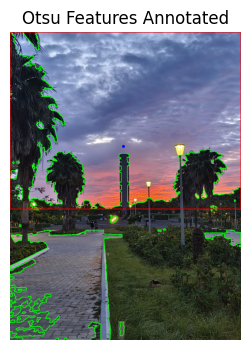

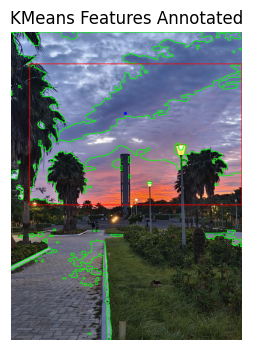

 Assembling full pipeline visualization...


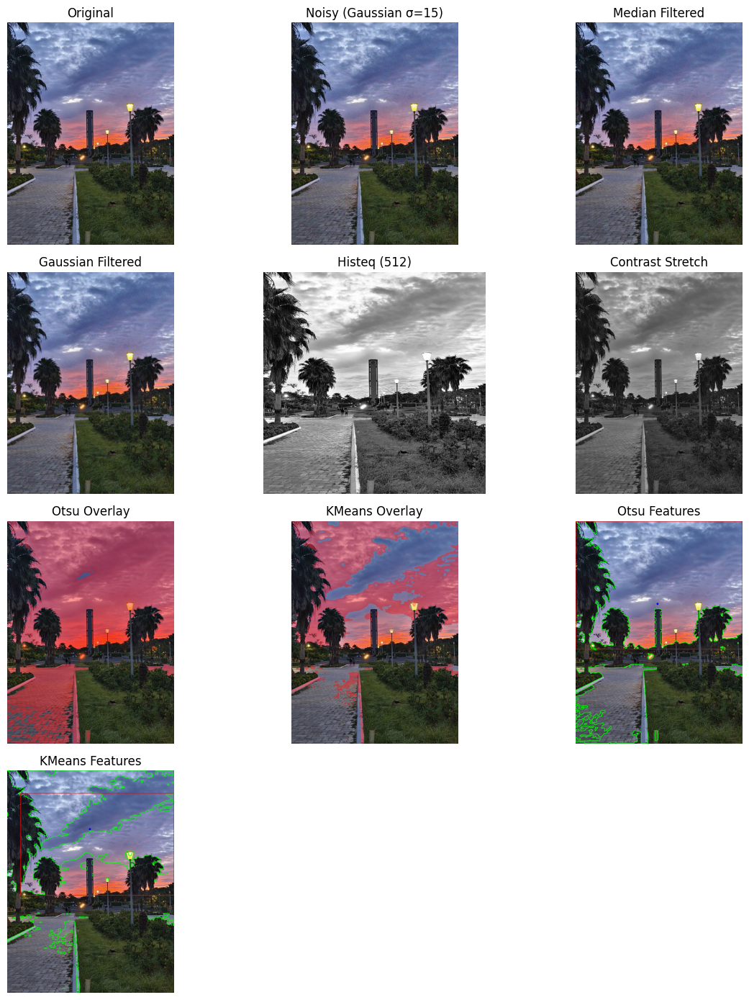

 Saved pipeline overview to: pipeline_outputs/pipeline_overview.png
 Saved reflection summary to: pipeline_outputs/pipeline_summary.txt


In [ ]:

import os
import cv2
import matplotlib.pyplot as plt
import numpy as np

OUT_DIR = "pipeline_outputs"
os.makedirs(OUT_DIR, exist_ok=True)

IMAGE_PATH = "image.jpeg"
NOISY_DIR = "noisy_outputs"
FILTER_DIR = "filter_outputs"
SEG_DIR = "segmentation_outputs"
FEATURE_DIR = "features_outputs"

def safe_read(p, as_gray=False):
    im = cv2.imread(p, cv2.IMREAD_GRAYSCALE if as_gray else cv2.IMREAD_COLOR)
    if im is None:
        print(f"[WARN] File not found: {p}")
    return im

print(" Loading images from previous steps...")

orig = safe_read(IMAGE_PATH)

noisy_example = safe_read(os.path.join(NOISY_DIR, "Gaussian_15.png"))
if noisy_example is None:
    noisy_example = safe_read(os.path.join(NOISY_DIR, "Gaussian_15p.png"))

median_example = safe_read(os.path.join(FILTER_DIR, "Gaussian_15_median.png"))
if median_example is None:
    median_example = safe_read(os.path.join(FILTER_DIR, "Gaussian_15p_median.png"))

gauss_example = safe_read(os.path.join(FILTER_DIR, "Gaussian_15_gauss.png"))
if gauss_example is None:
    gauss_example = safe_read(os.path.join(FILTER_DIR, "Gaussian_15p_gauss.png"))

gray_small = cv2.cvtColor(orig, cv2.COLOR_BGR2GRAY) if orig is not None else None
histeq = cv2.equalizeHist(cv2.resize(gray_small, (512, 512))) if gray_small is not None else None

contrast = None
if gray_small is not None:
    rmin, rmax = gray_small.min(), gray_small.max()
    contrast = ((gray_small - rmin) / (rmax - rmin) * 255).astype(np.uint8)

otsu_overlay = safe_read(os.path.join(SEG_DIR, "otsu_overlay.png"))
kmeans_overlay = safe_read(os.path.join(SEG_DIR, "kmeans_overlay.png"))

feat_otsu = safe_read(os.path.join(FEATURE_DIR, "otsu_features.png"))
feat_km = safe_read(os.path.join(FEATURE_DIR, "kmeans_features.png"))

print(" Displaying intermediate results...")

def show_image(img, title, cmap=None):
    plt.figure(figsize=(5, 4))
    if img is None:
        print(f"[WARN] Missing image for {title}")
        return
    if img.ndim == 2:
        plt.imshow(img, cmap=cmap or 'gray')
    else:
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis('off')
    plt.show()

show_image(orig, "Original Image")
show_image(noisy_example, "Noisy Image (Gaussian σ=15)")
show_image(median_example, "Median Filtered Image")
show_image(gauss_example, "Gaussian Filtered Image")
show_image(histeq, "Histogram Equalized Image")
show_image(contrast, "Contrast Stretched Image")
show_image(otsu_overlay, "Otsu Segmentation Overlay")
show_image(kmeans_overlay, "KMeans Segmentation Overlay")
show_image(feat_otsu, "Otsu Features Annotated")
show_image(feat_km, "KMeans Features Annotated")

print(" Assembling full pipeline visualization...")

panel_imgs = [
    orig, noisy_example, median_example, gauss_example,
    histeq, contrast, otsu_overlay, kmeans_overlay, feat_otsu, feat_km
]
panel_titles = [
    "Original", "Noisy (Gaussian σ=15)", "Median Filtered", "Gaussian Filtered",
    "Histeq (512)", "Contrast Stretch", "Otsu Overlay", "KMeans Overlay",
    "Otsu Features", "KMeans Features"
]

imgs_final, titles_final = [], []
for im, t in zip(panel_imgs, panel_titles):
    if im is not None:
        imgs_final.append(im)
        titles_final.append(t)

cols = 3
rows = int(np.ceil(len(imgs_final) / cols))
plt.figure(figsize=(cols * 4, rows * 3.5))

for i, (im, t) in enumerate(zip(imgs_final, titles_final)):
    plt.subplot(rows, cols, i + 1)
    if im.ndim == 2:
        plt.imshow(im, cmap='gray')
    else:
        plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))
    plt.title(t)
    plt.axis('off')

plt.tight_layout()

pipeline_fp = os.path.join(OUT_DIR, "pipeline_overview.png")
plt.savefig(pipeline_fp, dpi=150)
plt.show()
print(f" Saved pipeline overview to: {pipeline_fp}")

reflection = [
    "Pipeline Reflection:",
    "• What worked well: KMeans color clustering separated sky, vegetation, and object regions effectively.",
    "• Median filtering successfully removed salt-and-pepper noise.",
    "• Otsu thresholding gave simple binary segmentation, useful for clear contrast images.",
    "• What could be improved: Segmentation sometimes fragmented smaller objects; adaptive thresholding or watershed could improve boundaries.",
    "• Learned: Preprocessing order (denoising → enhancement → segmentation) significantly affects accuracy.",
    "• Contrast stretching preserved a more natural look compared to aggressive histogram equalization.",
    "• Future improvements: Add edge-based segmentation (Canny + Watershed), or use GrabCut for refined object isolation.",
    "• Feature extraction (centroid, area, bbox, histograms) provided useful summaries for object recognition tasks."
]

with open(os.path.join(OUT_DIR, "pipeline_summary.txt"), "w") as f:
    f.write("\n".join(reflection))

print(f" Saved reflection summary to: {os.path.join(OUT_DIR, 'pipeline_summary.txt')}")
